# Parallel raster computations using Dask

- Raster computations often involve **applying the same operation to different data pieces**.
- Example: **pixel-wise sum of two raster datasets**, applying the sum operation to all matching grid-cells.
- **Chunking input rasters into smaller pieces** can benefit such tasks:
  - Allows **parallel operations using multiple computing units** (e.g., multi-core CPUs), speeding up calculations.
  - Leads to **smaller memory footprints by processing data chunk by chunk**, avoiding the need to store the full dataset in memory.
- Using **Dask** for raster calculations:
  - Dask is a Python library for parallel and distributed computing.
  - Provides a framework for working with chunked arrays (Dask Arrays).
  - **Well integrated with (rio)xarray**, which can use Dask arrays as underlying data structures.
- Action plans:
  - Profile computation without chunking. Use **median filter** with *rolling* function as use case.
  - Load raster using rioxarray with Dask backend
  - Perform parallel computation

## Profiling the computation time

In [1]:
# Load the collection data obtained from the STAC
import pystac

items = pystac.ItemCollection.from_file("search.json")

In [2]:
items

In [4]:
# Select the last item for use case
assets = items[-1].assets
# Access the URL of the "visual" band from the last item
visual_href = assets["visual"].href

In [5]:
# Load the raster data
import rioxarray
# Open the visual band given the URL with overview level = 2
visual = rioxarray.open_rasterio(visual_href, overview_level=2)
# Print the resolution
print(visual.rio.resolution())

(79.97086671522214, -79.97086671522214)


In [6]:
# Load the raster data to memory. The actual download of the data happens here.
visual = visual.load()

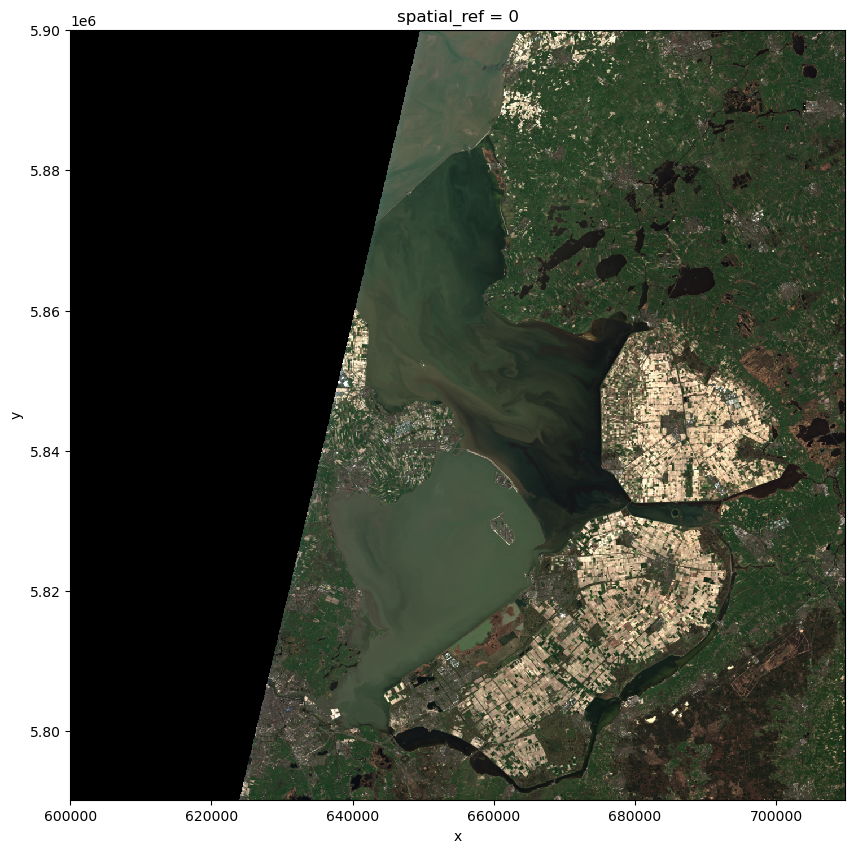

In [7]:
# Showing visual image
visual.plot.imshow(figsize=(10,10))

In [10]:
%%time
# Do the median filtering using rolling function with 7x7 window centered. Measure the execution time.
median = visual.rolling(x=7, y=7, center=True).median()

CPU times: user 6.18 s, sys: 1.68 s, total: 7.86 s
Wall time: 9.09 s


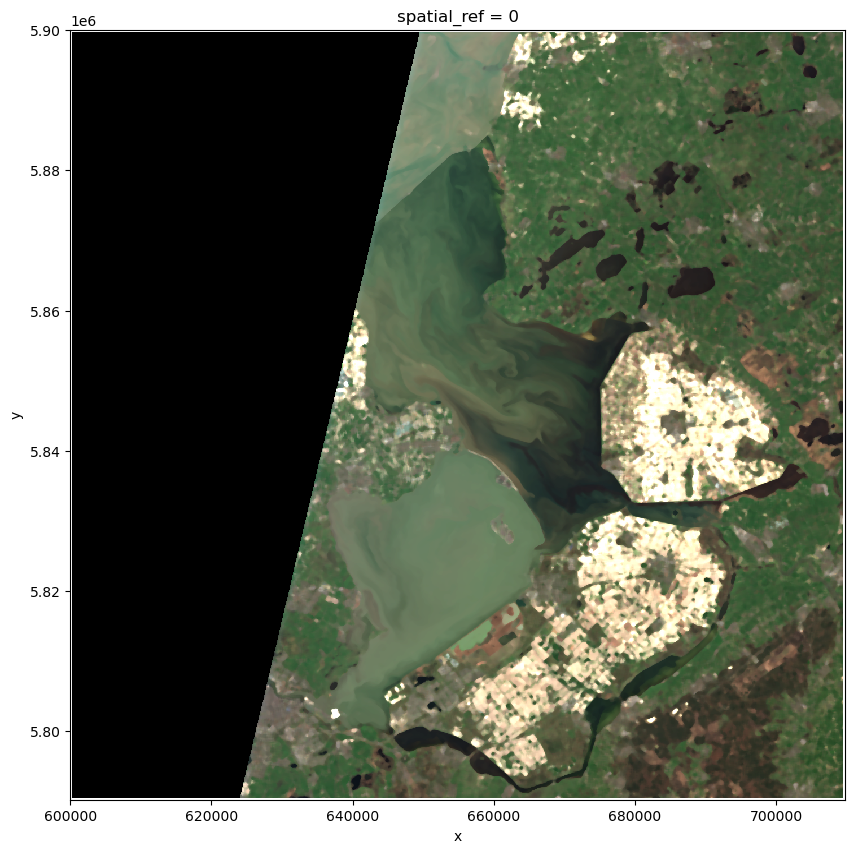

In [9]:
# Plot the median
median.plot.imshow(robust=True, figsize=(10,10))

In [12]:
# Save the raster output
median.rio.to_raster("visual-median-filter.tif")

## Load raster with Dask

In [15]:
# Access the blue band for example
# - Obtain URL of blue band
blue_band_href = assets["blue"].href
# - Open blue raster using rioxarray with specific chunk sizes
blue_band = rioxarray.open_rasterio(blue_band_href, chunks=True)

In [16]:
blue_band

<xarray.DataArray (band: 1, y: 10980, x: 10980)> Size: 241MB
dask.array<open_rasterio-dda2574a057e57a75f08f5696c622288<this-array>, shape=(1, 10980, 10980), dtype=uint16, chunksize=(1, 8192, 8192), chunktype=numpy.ndarray>
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 88kB 6e+05 6e+05 6e+05 ... 7.098e+05 7.098e+05
  * y            (y) float64 88kB 5.9e+06 5.9e+06 5.9e+06 ... 5.79e+06 5.79e+06
    spatial_ref  int64 8B 0
Attributes:
    OVR_RESAMPLING_ALG:  AVERAGE
    AREA_OR_POINT:       Area
    _FillValue:          0
    scale_factor:        1.0
    add_offset:          0.0

## Parallel computations

In [26]:
# Access the visual data using Dask as a backend, then do parallel computation
visual_dask = rioxarray.open_rasterio(visual_href, overview_level=2, lock=False, chunks=(3,500,500))

In [27]:
visual_dask

<xarray.DataArray (band: 3, y: 1373, x: 1373)> Size: 6MB
dask.array<open_rasterio-847d942ece306c6b82a233c0843a7bc0<this-array>, shape=(3, 1373, 1373), dtype=uint8, chunksize=(3, 500, 500), chunktype=numpy.ndarray>
Coordinates:
  * band         (band) int64 24B 1 2 3
  * x            (x) float64 11kB 6e+05 6.001e+05 ... 7.097e+05 7.098e+05
  * y            (y) float64 11kB 5.9e+06 5.9e+06 5.9e+06 ... 5.79e+06 5.79e+06
    spatial_ref  int64 8B 0
Attributes:
    OVR_RESAMPLING_ALG:  AVERAGE
    AREA_OR_POINT:       Area
    _FillValue:          0
    scale_factor:        1.0
    add_offset:          0.0

In [28]:
# Explicitely tell the Dask to parallelize over 4 threads
visual_dask = visual_dask.persist(scheduler="threads", num_workers=4)

In [29]:
%%time
# Do the computation in parallel with 4 workes and multithread strategy
median_dask = visual_dask.rolling(x=7, y=7, center=True).median()

CPU times: user 19.1 ms, sys: 2.06 ms, total: 21.2 ms
Wall time: 22.3 ms


In [30]:
import dask
dask.visualize(median_dask)

In [31]:
%%time
# Perform the real calculation here
median_dask = median_dask.persist(scheduler="threads", num_workers=8)

CPU times: user 8.01 s, sys: 3.93 s, total: 11.9 s
Wall time: 3.2 s


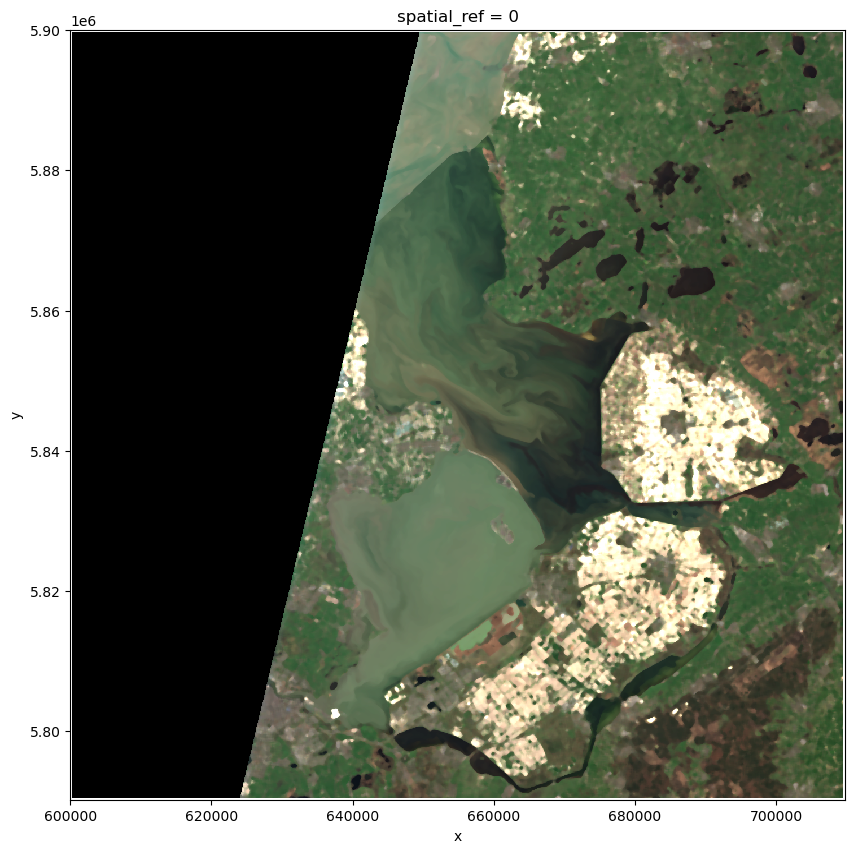

In [23]:
median_dask.plot.imshow(robust=True, figsize=(10,10))

In [33]:
# Save the raster with multiple tiling
from threading import Lock
# Use tiling mechanism -> the write is perform as chunked GeoTIF, then synchronize using the Lock
median_dask.rio.to_raster("visual_median-filter_dask.tif", tiled=True, lock=Lock())